# Topic: Word frequency and sentiment analysis of covid 19 tweets

#Dataset source: The datasets for this project is from Kaggle. A covid-19 tweets data acquired by Gabriel Preda (https://github.com/gabrielpreda/Kaggle).
#The dataset consists of a 65 megabyte data size. 
#The period of the acqusition is from the early beginning of the pandemic, Febraury (2020) to August (2020) before the introduction of the covid-19 vaccines in late December 2020
#The dataset made up of the username, user_location, user_description, user_created, user_followers, user_friends, 'user_favourites', 'user_verified', date, text, hashtags, source, retweet.

# Project Task
+ Importing packages
+ Load and read dataset using pandas
+ Extracting tweets sources and users location
+ Text Preprocessing
+ Keywords Extraction
+ Sentiment Analysis using Textblob and Vadar sentiment analyzer
+ Word frequency for the sentiments score using  a WordCloud

In [1]:
#Importing packages
import os, codecs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
import plotly.express as px
import neattext.functions as nfx
import neattext as nt

import nltk
from collections import Counter
from nltk.tokenize import sent_tokenize
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alexander\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Alexander\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [2]:
#Load and read the dataset using pandas
df = pd.read_csv('covid19_tweets.csv')

In [3]:
df.head() # Viewing the content of the dataset

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [4]:
# Looking at the data type 
df.dtypes

user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [5]:
# Extracting the source of the tweet and the top most sources by passing on the following function
df['source'].unique() # This will show all the sources of the tweet 

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [6]:
# Let do the value count of the tweet source by passing in the string and funtion
df['source'].value_counts() # This show the top most applications use for the tweet

Twitter Web App        56891
Twitter for Android    40179
Twitter for iPhone     35472
TweetDeck               8543
Hootsuite Inc.          7321
                       ...  
sphere_ja_bot              1
CoronaWatchUSA             1
Apphi                      1
Partisan Issues?           1
Dram Scotland              1
Name: source, Length: 610, dtype: int64

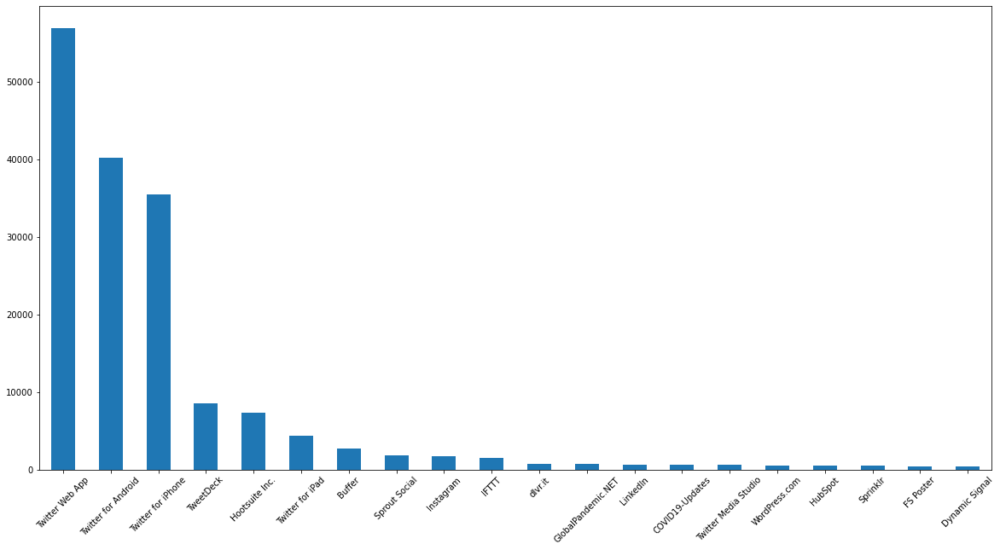

In [8]:
# Let plot the tweet source, the starting from 20 most largest sources using the nlargest function
plt.figure(figsize=(20,10))
df['source'].value_counts().nlargest(20).plot(kind='bar')
plt.xticks(rotation=45) # Rotate the plot at 45 degrees for correct view
plt.show()

In [9]:
# Let extract the location of the tweet by the users who tweets
df['user_location'].unique()

array(['astroworld', 'New York, NY', 'Pewee Valley, KY', ...,
       'Newton, NJ', 'T.O.', 'Aliwal North, South Africa'], dtype=object)

In [10]:
# Let do a value count of the users location and plot it
df['user_location'].value_counts() # Most of the tweets are from India and United States


India                   3741
United States           2455
New Delhi, India        1721
Mumbai, India           1401
Washington, DC          1354
                        ... 
Bahrain/London/Paris       1
present                    1
Istanbul, TURKEY           1
Gorakhpur                  1
South Wales, UK.           1
Name: user_location, Length: 26920, dtype: int64

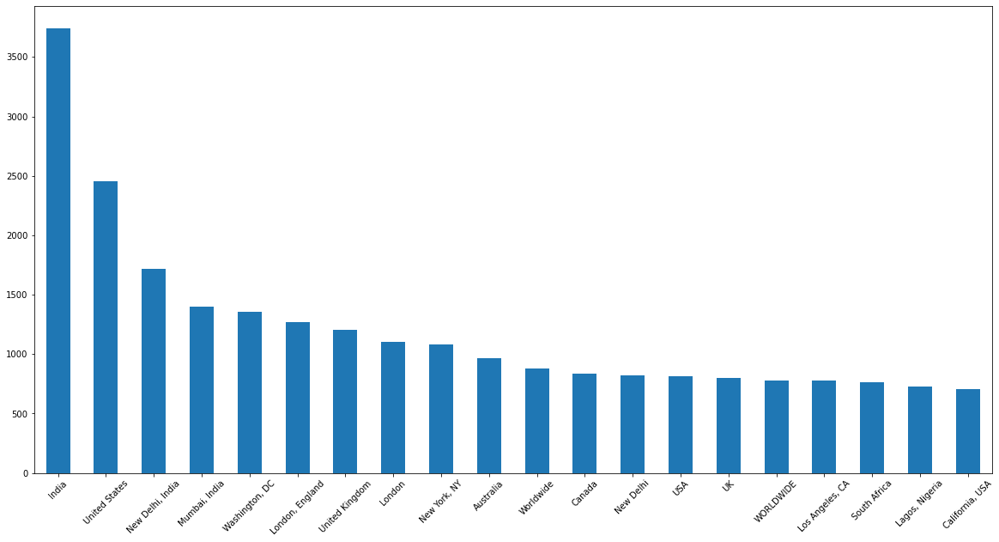

In [12]:
# Let do a value count of the users location and plot it
plt.figure(figsize=(20,10))
df['user_location'].value_counts().nlargest(20).plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

#Text Preprocessing
+ Extract text from the tweets
+ Clean the clean the text

In [13]:
#Text Analysis
# We will use neattext and other nltk packages as they have alread been imported to clean and analyse the data
# you can use the function below to view the content of the neattext package
# import neattext.function as nfx / import neattext as nt
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [14]:
# Extract the text and named it as clean_tweet and compare it with the original text from the tweets. 
df['text'].iloc[0] # text column to view the first  value of tweet text

'If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated that… https://t.co/QZvYbrOgb0'

#Clean our text for the tweet data by removing the following noise 
+ hashtags
+ userhandles
+ urls
+ emojis
+ special characters
+ multiple spaces

In [15]:
# Clean the data and store it in a  variable or column called clean_tweet asfter passing on this function
df['clean_tweet'] = df['text'].apply(nfx.remove_hashtags)

In [16]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_emojis(x)) # remove emojis

In [17]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_urls(x))

In [18]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_multiple_spaces(x))

In [19]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_special_characters(x))

In [20]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_puncts(x)) # remove punctuations

In [21]:
# Let compare the vatiable Clean_tweet and the orignial text using the function
df[['text', 'clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey Yankees YankeesPR and MLB wouldnt it have...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,diane3443 wdunlap realDonaldTrump Trump never ...
3,@brookbanktv The one gift #COVID19 has give me...,brookbanktv The one gift has give me is an app...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July Media Bulletin on Novel kansalrohit69...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks IamOhmai for nominating me for the WHO ...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020 The year of insanity Lol
179105,@CTVNews A powerful painting by Juan Lucena. I...,CTVNews A powerful painting by Juan Lucena Its...
179106,"More than 1,200 students test positive for #CO...",More than 1200 students test positive for at m...


#Sentiment Analysis

#Sentiment Analysis of the clean tweet using Textblob and Vadar sentiment analyzer
#Textblob sentiment analyzer returns two properties for a given input sentence:
#Polarity is a float that lies between [-1,1], -1 indicates negative sentiment and +1 indicates positive sentiments.
#Subjectivity is also a float that lies in the range of [0,1]. Subjective sentences generally refer to opinion, emotion, or judgment.
#Vadar uses a list of lexical features (e.g. word) which are labeled as positive or negative according to their semantic orientation to calculate the text sentiment.
#Vader sentiment returns the probability of a given input sentence to be positive, negative, and neutral.

In [24]:
# Sentiiment Analysis
## from textblob import TextBlob
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
            sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
            sentiment_label = 'Negative'
    else:
            sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
                  'subjectivity':sentiment_subjectivity,
                  'sentiment':sentiment_label}
    return result

In [25]:
# Test the function first on the entire clean_tweet
# Let use the value text and passing in to the first value
text = df['clean_tweet'].iloc[0]

In [26]:
get_sentiment

<function __main__.get_sentiment(text)>

In [27]:
get_sentiment(text) # view the polarity and subjectivity of the first value of the clean_tweet

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [28]:
# Apply the simple function created above to the entire clean_tweet
df['sentiment_results'] = df['clean_tweet'].apply(get_sentiment) # pass in the function get_sentiment

In [29]:
df['sentiment_results'] # Display a dictionary of the sentiment

0         {'polarity': -0.25, 'subjectivity': 0.25, 'sen...
1         {'polarity': 0.5, 'subjectivity': 0.5, 'sentim...
2         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
3         {'polarity': 0.0, 'subjectivity': 0.3571428571...
4         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
                                ...                        
179103    {'polarity': 0.2, 'subjectivity': 0.2, 'sentim...
179104    {'polarity': 0.8, 'subjectivity': 0.7, 'sentim...
179105    {'polarity': 0.3, 'subjectivity': 1.0, 'sentim...
179106    {'polarity': 0.26325757575757575, 'subjectivit...
179107    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
Name: sentiment_results, Length: 179108, dtype: object

In [30]:
#Using pandas to split the dictionary created  for the sentiment score or results into columns
# Let first pass in the function sentiment_results to the first value for the clean_tweet
df['sentiment_results'].iloc[0]

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [31]:
# use pd.json function to normalize a dictionary created and convert them into individual columns
pd.json_normalize(df['sentiment_results'].iloc[0])

,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [32]:
# Join them together to create nice columns
df = df.join(pd.json_normalize(df['sentiment_results']))

In [33]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,Hey Yankees YankeesPR and MLB wouldnt it have...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,diane3443 wdunlap realDonaldTrump Trump never ...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,brookbanktv The one gift has give me is an app...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,25 July Media Bulletin on Novel kansalrohit69...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [34]:
# Find the number of sentiment counts, positive, negative and neutral
df['sentiment'].value_counts()

Neutral     74621
Positive    74496
Negative    29991
Name: sentiment, dtype: int64

C:\Program Files\New folder\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='sentiment', ylabel='count'>

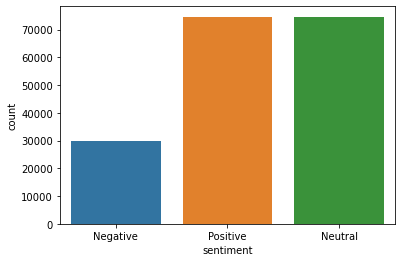

In [35]:
# Using the seaborn to plot the percentage of negative, positive and neutral sentiments
# The plot show there are more positive and neutral sentiment in the tweet than negative sentiment
sns.countplot(df['sentiment']) #There are more positive and neutral sentiments in the tweet than negative sentiment.

# Sentiment Analysis Using Vadar Analyzer

In [36]:
#Getting the polarity of each score, calculate the percentage of each sentiment present in that sentence using "pos", "neu" and "neg" keys
# from vaderSentiment.vaderSentiment import SentimentIntensityAnalyer
sid=SentimentIntensityAnalyzer()
df['scores'] = df['clean_tweet'].apply(lambda clean_tweet: sid.polarity_scores(clean_tweet))

In [37]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,clean_tweet,sentiment_results,polarity,subjectivity,sentiment,scores
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative,"{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'comp..."
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,Hey Yankees YankeesPR and MLB wouldnt it have...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive,"{'neg': 0.062, 'neu': 0.837, 'pos': 0.101, 'co..."
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,diane3443 wdunlap realDonaldTrump Trump never ...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral,"{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'comp..."
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,brookbanktv The one gift has give me is an app...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral,"{'neg': 0.0, 'neu': 0.733, 'pos': 0.267, 'comp..."
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,25 July Media Bulletin on Novel kansalrohit69...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral,"{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'comp..."


In [38]:
# Assessing the sentiment score using the lambda function and compound score
df['compound'] = df['scores'].apply(lambda score_dict: score_dict['compound'])
df['sentiment_type']=''
df.loc[df.compound>0,'sentiment_type']='POSITIVE'
df.loc[df.compound==0,'sentiment_type']='NEUTRAL'
df.loc[df.compound<0,'sentiment_type']='NEGATIVE'

In [39]:
df.head() # view sentiment core for vadar. when the compound score indicates either positive, neutral and positive

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,source,is_retweet,clean_tweet,sentiment_results,polarity,subjectivity,sentiment,scores,compound,sentiment_type
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,...,Twitter for iPhone,False,If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative,"{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'comp...",0.4939,POSITIVE
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,...,Twitter for Android,False,Hey Yankees YankeesPR and MLB wouldnt it have...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive,"{'neg': 0.062, 'neu': 0.837, 'pos': 0.101, 'co...",0.2263,POSITIVE
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,...,Twitter for Android,False,diane3443 wdunlap realDonaldTrump Trump never ...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral,"{'neg': 0.116, 'neu': 0.884, 'pos': 0.0, 'comp...",-0.2732,NEGATIVE
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,...,Twitter for iPhone,False,brookbanktv The one gift has give me is an app...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral,"{'neg': 0.0, 'neu': 0.733, 'pos': 0.267, 'comp...",0.7351,POSITIVE
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,...,Twitter for Android,False,25 July Media Bulletin on Novel kansalrohit69...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral,"{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'comp...",0.3182,POSITIVE


In [40]:
# Let do sentiment counts 
df['sentiment_type'].value_counts()

POSITIVE    69599
NEUTRAL     60642
NEGATIVE    48867
Name: sentiment_type, dtype: int64

C:\Program Files\New folder\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='sentiment_type', ylabel='count'>

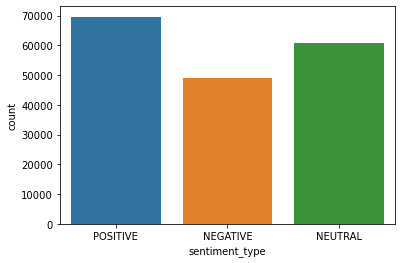

In [41]:
# Using the seaborn to plot the percentage of negative, positive and neutral sentiments.
# The plot show there are more positive and neutral sentiment in the tweet than negative sentiment
# However as compare to Textblob, vadar is able to show more negative sentiment in the tweet than Textblob.
sns.countplot(df['sentiment_type'])

# Extract keywords from the tweet text (Clean_tweet)
+ Postive, Neutral and Negative Sentiment

In [43]:
# Let passed in this function for the positive, neutral and negative tweet
positive_tweet = df[df['sentiment'] == 'Positive']['clean_tweet']
negative_tweet = df[df['sentiment'] == 'Negative']['clean_tweet']
neutral_tweet = df[df['sentiment'] == 'Neutral']['clean_tweet']

In [44]:
# View positive tweet
positive_tweet

1         Hey Yankees YankeesPR and MLB  wouldnt it have...
6         How Will Change Work in General and recruiting...
8         Praying for good health and recovery of Chouha...
12        PattyHajdu NavdeepSBains  no one will be safe ...
13        Lets all protect ourselves from Its real and t...
                                ...                        
179096    We were really bummed we couldnt cop one of th...
179103    Thanks IamOhmai for nominating me for the WHO ...
179104                       2020 The year of insanity Lol 
179105    CTVNews A powerful painting by Juan Lucena Its...
179106    More than 1200 students test positive for at m...
Name: clean_tweet, Length: 74496, dtype: object

In [45]:
# Removing stopwords and convert to Tokens.
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [46]:
# view positive tweet after removing the stopwords
positive_tweet_list

['Hey Yankees YankeesPR MLB wouldnt sense players pay respects',
 'Change Work General recruiting specifically ProactiveTalent',
 'Praying good health recovery ChouhanShivraj',
 'PattyHajdu NavdeepSBains safe safe commit ensure',
 'Lets protect real numbers climbing fast ContinentLets n',
 'Second wave Flandersback',
 'COVID Update infection rate Florida following natural curve experts predicted initial cu',
 'EvanAKilgore realDonaldTrump Good PatriotsCall Volunteer Election Judge Polls open',
 'comprehensive review amp Analysis key ways WASH help reduce transmission',
 'crosses 2 lakh mark 150055 ppp recovered far positive today 6988total',
 'Actor VishalKOfficial father MrGKReddy tested positive 1520 days',
 'safe place visit guests said hotel meticulous applying hand sanitation als',
 'CEO RamneekHH live SASCOJikelele WSU talking effects Covid19 students',
 'Actionables healthy recovery',
 'jfoster2019 bbclaurak understood hadnt missed meeting',
 'released new podcast episodes weekT

In [47]:
# Tokenization
for line in positive_tweet_list: 
    #   print(line)
 for token in line.split():
        print(token)

Hey
Yankees
YankeesPR
MLB
wouldnt
sense
players
pay
respects
Change
Work
General
recruiting
specifically
ProactiveTalent
Praying
good
health
recovery
ChouhanShivraj
PattyHajdu
NavdeepSBains
safe
safe
commit
ensure
Lets
protect
real
numbers
climbing
fast
ContinentLets
n
Second
wave
Flandersback
COVID
Update
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu
EvanAKilgore
realDonaldTrump
Good
PatriotsCall
Volunteer
Election
Judge
Polls
open
comprehensive
review
amp
Analysis
key
ways
WASH
help
reduce
transmission
crosses
2
lakh
mark
150055
ppp
recovered
far
positive
today
6988total
Actor
VishalKOfficial
father
MrGKReddy
tested
positive
1520
days
safe
place
visit
guests
said
hotel
meticulous
applying
hand
sanitation
als
CEO
RamneekHH
live
SASCOJikelele
WSU
talking
effects
Covid19
students
Actionables
healthy
recovery
jfoster2019
bbclaurak
understood
hadnt
missed
meeting
released
new
podcast
episodes
weekTechnology
Platforms
Conduct
Telehealth
VisitsC
Britain
didnt
u

In [48]:
# check the token for both positive, neutral and negative sentiment 
pos_tokens = [token for line in positive_tweet_list for token in line.split()]
neg_tokens = [token for line in negative_tweet_list for token in line.split()]
neu_tokens = [token for line in neutral_tweet_list for token in line.split()]

In [49]:
pos_tokens

['Hey',
 'Yankees',
 'YankeesPR',
 'MLB',
 'wouldnt',
 'sense',
 'players',
 'pay',
 'respects',
 'Change',
 'Work',
 'General',
 'recruiting',
 'specifically',
 'ProactiveTalent',
 'Praying',
 'good',
 'health',
 'recovery',
 'ChouhanShivraj',
 'PattyHajdu',
 'NavdeepSBains',
 'safe',
 'safe',
 'commit',
 'ensure',
 'Lets',
 'protect',
 'real',
 'numbers',
 'climbing',
 'fast',
 'ContinentLets',
 'n',
 'Second',
 'wave',
 'Flandersback',
 'COVID',
 'Update',
 'infection',
 'rate',
 'Florida',
 'following',
 'natural',
 'curve',
 'experts',
 'predicted',
 'initial',
 'cu',
 'EvanAKilgore',
 'realDonaldTrump',
 'Good',
 'PatriotsCall',
 'Volunteer',
 'Election',
 'Judge',
 'Polls',
 'open',
 'comprehensive',
 'review',
 'amp',
 'Analysis',
 'key',
 'ways',
 'WASH',
 'help',
 'reduce',
 'transmission',
 'crosses',
 '2',
 'lakh',
 'mark',
 '150055',
 'ppp',
 'recovered',
 'far',
 'positive',
 'today',
 '6988total',
 'Actor',
 'VishalKOfficial',
 'father',
 'MrGKReddy',
 'tested',
 'positi

In [50]:
# Count  the most common keywords using the counter package
# we need to create a function containing the most commonest keywords and pass in the number of tokens
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)  # create a dictionary
    return result # return the result of the function created

In [51]:
get_tokens(pos_tokens) # get positive tokens

{'cases': 10661,
 'new': 10101,
 'amp': 5460,
 'positive': 3955,
 'people': 3757,
 'deaths': 3430,
 'New': 3228,
 'COVID19': 2923,
 'pandemic': 2053,
 'total': 1859,
 'reported': 1789,
 'safe': 1754,
 'today': 1712,
 'confirmed': 1609,
 'time': 1513,
 'latest': 1502,
 'like': 1498,
 'good': 1495,
 'need': 1458,
 'tested': 1434,
 'coronavirus': 1431,
 '24': 1387,
 'day': 1373,
 '2020': 1365,
 'right': 1312,
 'number': 1310,
 'India': 1295,
 'reports': 1271,
 'health': 1270,
 'vaccine': 1233}

In [52]:
get_tokens(neg_tokens)

{'cases': 2384,
 'amp': 2153,
 'people': 1880,
 'COVID19': 990,
 'pandemic': 932,
 'spread': 898,
 'realDonaldTrump': 841,
 'like': 814,
 'daily': 776,
 'slow': 745,
 'new': 742,
 'risk': 720,
 'deaths': 687,
 'dont': 652,
 'symptoms': 638,
 'Im': 637,
 'Ill': 633,
 'day': 613,
 'time': 578,
 'Help': 578,
 'health': 562,
 'long': 556,
 'know': 544,
 'virus': 539,
 'identify': 533,
 'sooner': 529,
 'selfreporting': 522,
 'dead': 508,
 'mask': 506,
 '2020': 504}

In [53]:
# Let find the most common  positive, negative and neutral words for the tweet
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neu_words = get_tokens(neu_tokens)

In [54]:
pos_df = pd.DataFrame(most_common_pos_words.items()) # create a function for the positive words

In [55]:
pos_df # view the positive words

,0,1
0,cases,10661
1,new,10101
2,amp,5460
3,positive,3955
4,people,3757
5,deaths,3430
6,New,3228
7,COVID19,2923
8,pandemic,2053
9,total,1859


In [56]:
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','count']) # word counts

In [57]:
pos_df # create columns for the positive words

,words,count
0,cases,10661
1,new,10101
2,amp,5460
3,positive,3955
4,people,3757
5,deaths,3430
6,New,3228
7,COVID19,2923
8,pandemic,2053
9,total,1859


<function matplotlib.pyplot.show(close=None, block=None)>

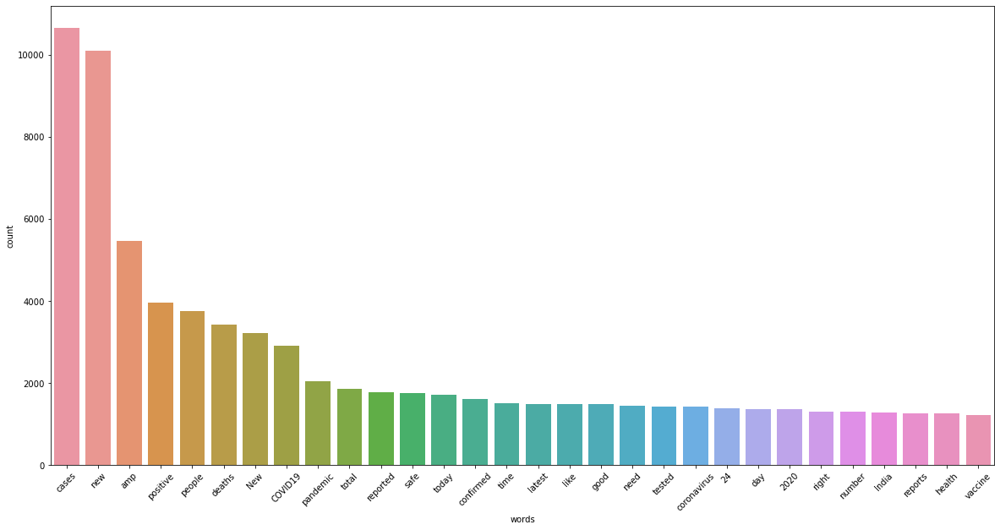

In [58]:
#Plot with seabon the positive words
plt.figure(figsize=(20,10))
sns.barplot(x='words', y='count', data=pos_df)
plt.xticks(rotation=45)
plt.show

In [66]:
# Using wordcloud to count the most commonnest words in the tweet
from wordcloud import WordCloud

In [67]:
## create a function to pass the wordcloud argument
def plot_wordcloud(docx):
    plt.figure(figsize=(25,5))
    mywordcloud = WordCloud().generate(docx) # use generate to pass the docx
    plt.imshow(mywordcloud,interpolation='bilinear') #bilinear interpolation is an extension of linear interpolation for interpolating functions of two variables (e.g., x and y) on a rectilinear 2D grid
    plt.axis('off') # This will not show the axis behind
    plt.show()

In [68]:
#convert the entired positive documents into a string or list
pos_docx = ' '.join(pos_tokens)
neg_docx = ' '.join(neg_tokens)
neu_docx = ' '.join(neu_tokens)

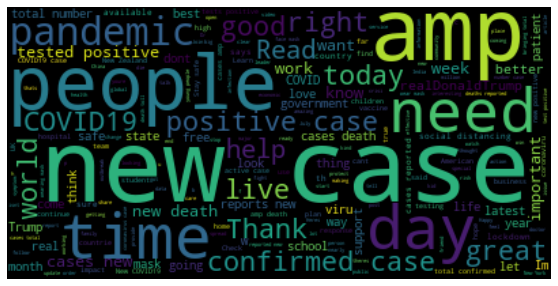

In [69]:
plot_wordcloud(pos_docx)

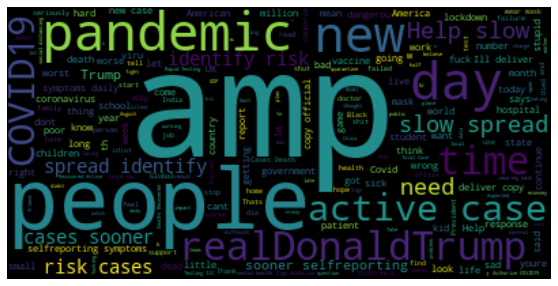

In [70]:
plot_wordcloud(neg_docx)

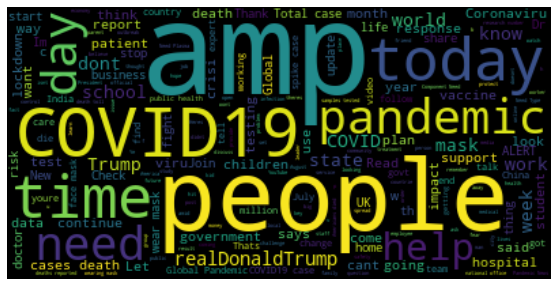

In [71]:
plot_wordcloud(neu_docx)